In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import random

In [2]:
class Kmeans :
    def __init__(self,k,cluster_centre,max_iter):
        self.K = k
        self.centroids = cluster_centre
#         each row will store a different cluster centre,columns of that row will be the centre for that feature.
        self.max_iter = max_iter
    
    def distance(self,x,y):

        return np.linalg.norm(x[0,:] - y[0:])
    
    def assignClusters(self,X):
#         X is array ,NOT DATAFRAME !!
        rows,columns = X.shape
        assignedClusters = [] # stores the assigned cluster for each sample
        clusterpoints = [[] for i in range(self.K)] # for each cluster points it stores the index of samples which belong to that cluster
        for i in range(rows):
            cluster = -1
            minDistance = 1e9
            for j in range(self.K):
#                 print(X[i:i+1,:])
                dist = self.distance(X[i:i+1,:],self.centroids[j:j+1,:]) # distance of sample from jth cluster
                if(dist < minDistance):
                    minDistance = dist
                    cluster = j
            assignedClusters.append(cluster)
            clusterpoints[cluster].append(i)
#         print(assignedClusters)
        return assignedClusters,clusterpoints
        
    def getnewCentroids(self,X):
        assignedClusters,clusterpoints = self.assignClusters(X)
        newCentroids = []
        r,d = X.shape
        for i in range(self.K):
            newX = X[clusterpoints[i],:]
            centre = []
            for col in range(d):
                centre.append(np.mean(newX[:,col]))
            newCentroids.append(centre)
        return np.array(newCentroids),assignedClusters
    
    def fit(self,X):
        b = True
        iterations = 0
        n = self.K*(X.shape[1])
        print(n)
        prevscore = 0.0
        while(b):
            print(iterations)
            iterations += 1
            newCentroids,assignClusters = self.getnewCentroids(X)
            score = 1 - ((newCentroids == self.centroids).sum()/n) # fraction of values which are not same in the 2 arrays
            
            print(score)
            print(prevscore - score)
            if((score - prevscore) == 0):  # Condition for convergence : if the score is not changing then it will stop
#             if(score == 0):
                b = False
                print("CONVERGED!!!! with a score of {}".format(score))
                return assignClusters
            else :
                self.centroids = newCentroids
            if(iterations >= self.max_iter):  # Condtion for max_iterations
                b = False
                return assignClusters
            prevscore = score

    def SSE(self,X,predicted):
        error = 0
        r,d = X.shape
        for i in range(r):
            classlabel = predicted[i]
            error += self.distance(X[i:i+1,:],self.centroids[classlabel:classlabel+1,:])**2
        return error
        

In [3]:
from sklearn import datasets
data = datasets.fetch_olivetti_faces()
type(data)

sklearn.utils.Bunch

In [4]:
X = data["data"]

In [5]:
X.shape

(400, 4096)

# Original Images For each class


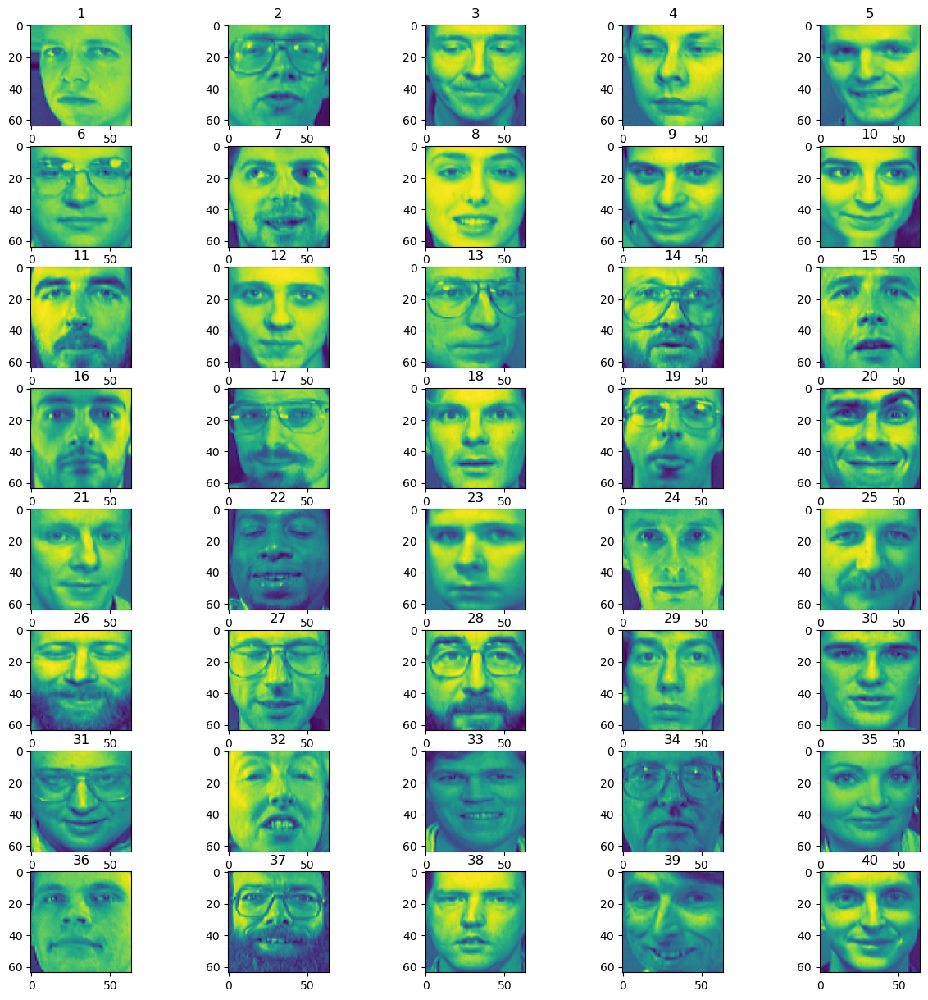

In [6]:
# pred = model.fit(X)
def imagearray(pixels):
#     pixels is a list
    dim = 64
    pix = np.zeros((dim,dim))
    for i in range(dim):
        for j in range(dim):
            pix[i,j] = pixels[64*i + j]
    return pix
j = 1
plt.figure(figsize = (15,15))
for i in range(40):
    plt.subplot(8,5,j)
    data = imagearray(list(X[(10*i)+5,:]))
    plt.imshow(data)
    plt.title(j)
    j+=1

# C) Training KMeans with random intializers

#    images of random initializers

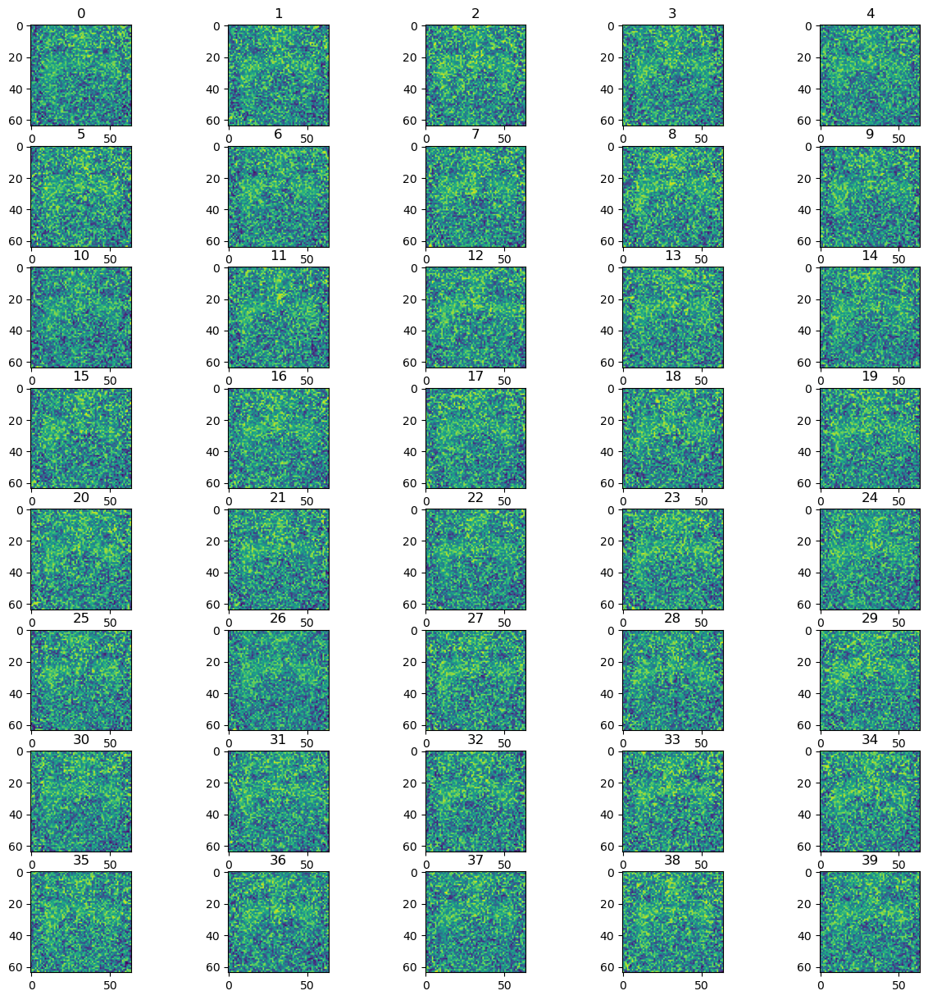

In [7]:
centroids = []
plt.figure(figsize = (15,15))
j = 1
for i in range(40):
    point = [np.random.uniform(max(X[:,i]),min(X[:,i])) for i in range(4096)]
    centroids.append(point)
    plt.subplot(8,5,j)
    data = imagearray(point)
    j += 1
    plt.imshow(data)
    plt.title(i)
    
# print(point)
# model2 = Kmeans(10,)



In [8]:
centroids = np.array(centroids)

In [9]:
centroids.shape

(40, 4096)

Model Training

In [10]:
model1 = Kmeans(40,centroids,40)

In [11]:
pred1 = model1.fit(X)

163840
0


C:\Users\vidit\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\vidit\anaconda3\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


1.0
-1.0
1
0.973968505859375
0.026031494140625
2
0.874468994140625
0.09949951171875004
3
0.774420166015625
0.10004882812499993
4
0.74991455078125
0.024505615234375
5
0.674951171875
0.07496337890625004
6
0.57498779296875
0.09996337890624996
7
0.549993896484375
0.024993896484375
8
0.5
0.04999389648437502
9
0.5
0.0
CONVERGED!!!! with a score of 0.5


# Unique number of cluster and Number of samples for each cluster

In [12]:
len(np.unique(pred1))

20

In [13]:
series = pd.Series(pred1)
print(series.value_counts())

39    60
29    40
6     37
24    32
34    32
19    30
26    24
23    24
7     23
22    18
30    16
17    15
12    12
0      9
25     7
14     7
8      5
21     5
28     3
16     1
dtype: int64


# d) Cluster center of each cluster 

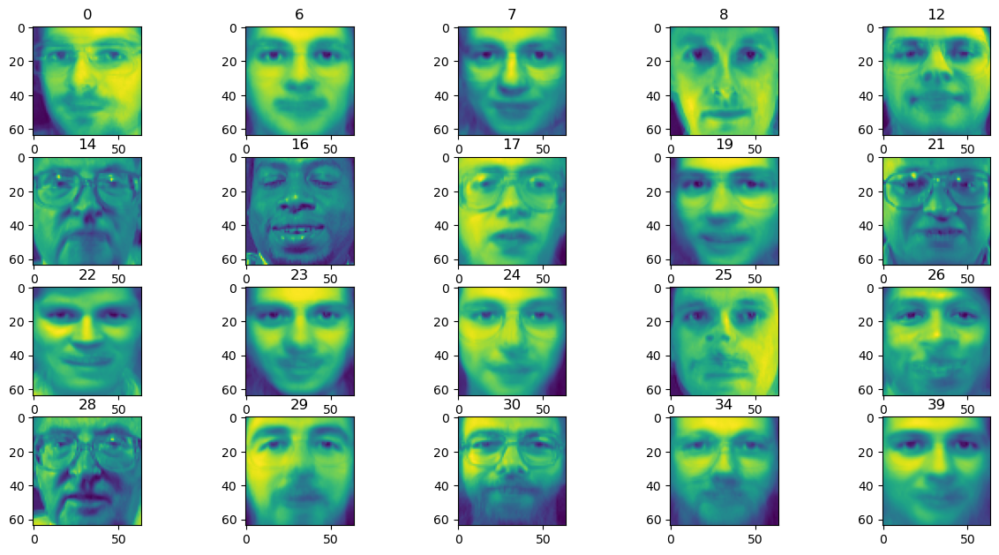

In [14]:
centroids = model1.centroids
j = 1
plt.figure(figsize = (15,15))
for i in np.unique(pred1):
    data = imagearray(list(centroids[i,:]))
    plt.subplot(8,5,j)
    j += 1
    plt.imshow(data)
    plt.title(i)

# e) images of each cluster 
predicted cluster <-> actual cluster

In [15]:
imagesforeachCluster = [[] for i in range(40)]
for index,cluster in enumerate(pred1):
    imagesforeachCluster[cluster].append(index)
# print((imagesforeachCluster))

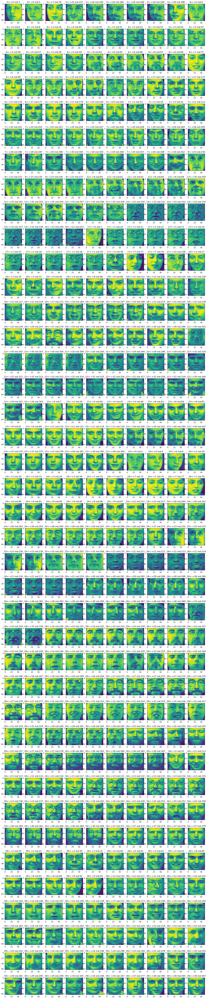

In [16]:
plt.figure(figsize = (20,100))
c = 1
for i in range(40):
    n = len(imagesforeachCluster[i])
    j = 0
    while(j<n):
        plt.subplot(40,10,c)
        c+=1
        imgind = imagesforeachCluster[i][j]
        data = imagearray(list(X[imgind,:]))
        plt.title(str(i)+ "<->" + str(int(imgind/10)) + " ind:" + str(imgind))
        plt.imshow(data)
        j += 1

# Sum of Squared Errors 


In [17]:
print(model1.SSE(X,pred1))

16872.764356513526


# Initializing centres with mean of images for each class

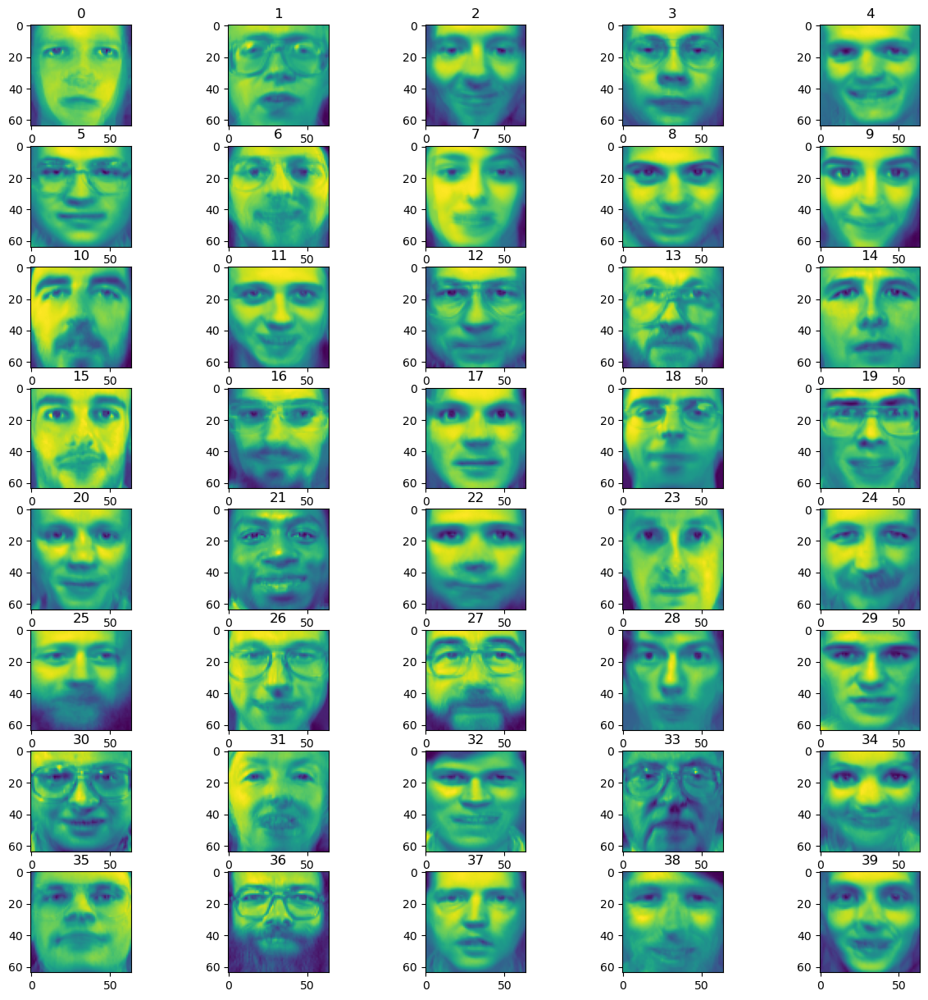

In [18]:
centres = np.ones((40,4096))
# centres = np.ones((10,4096))/

plt.figure(figsize = (15,15))
x = 1
for i in range(40):
    centres[i,:] = np.mean(X[10*i:(10*i) + 10,:],axis = 0)
#     centres[i,:] = X[10*i:(10*i) + 1,:]
    
    plt.subplot(8,5,x)
    x += 1
    data = imagearray(list(centres[i,:]))
    plt.imshow(data)
    plt.title(i)

In [19]:
model2 = Kmeans(40,centres,20)

In [20]:
pred2 = model2.fit(X)

163840
0
0.63046875
-0.63046875
1
0.249481201171875
0.380987548828125
2
0.19948730468749998
0.04999389648437502
3
0.12456665039062498
0.074920654296875
4
0.0
0.12456665039062498
5
0.0
0.0
CONVERGED!!!! with a score of 0.0


## Unique number of cluster and Number of samples for each cluster


In [21]:
len(np.unique(pred2))

40

In [22]:
series = pd.Series(pred2)
print(series.value_counts())

39    15
29    15
8     12
7     12
24    12
12    12
22    11
20    11
38    11
14    10
18    10
19    10
21    10
27    10
26    10
25    10
30    10
31    10
32    10
33    10
35    10
17    10
36    10
15    10
11    10
10    10
6     10
5     10
13    10
1     10
3      9
16     9
37     9
28     9
23     9
4      8
9      8
2      6
34     6
0      6
dtype: int64


# images of each cluster
predicted cluster <-> actual cluster

In [23]:
imagesforeachCluster = [[] for i in range(40)]
for index,cluster in enumerate(pred2):
    imagesforeachCluster[cluster].append(index)

In [ ]:
plt.figure(figsize = (20,100))
c = 1
for i in range(40):
    n = len(imagesforeachCluster[i])
    for j in range(16):
        if(j>=n) :
            continue
        plt.subplot(40,10,c)
        c+=1
        imgind = imagesforeachCluster[i][j]
        data = imagearray(list(X[imgind,:]))
        plt.title(str(i)+ "<->" + str(int(imgind/10)) + " ind:" + str(imgind))
        plt.imshow(data)
    

# Centroids of all clusters

In [ ]:
j = 1
plt.figure(figsize = (15,15))
centroids = model2.centroids
for i in np.unique(pred2):
    data = imagearray(list(centroids[i,:]))
    plt.subplot(8,5,j)
    j += 1
    plt.imshow(data)
    plt.title(i)

# Sum of Squared Error

In [ ]:
print(model2.SSE(X,pred2))